# **Meso Analysis - Hashtags**

Autores: **Anny Delaine Álvarez Nogales** y **Jorge del Castillo Gómez**

---

### Funciones auxiliares

In [1]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np
import pandas as pd
from pyvis.network import Network
import matplotlib.cm as cm
import warnings
warnings.filterwarnings("ignore")

colormap = plt.cm.tab20

def str_color(r, g, b, a):
    '''
    Convierte un color RGBA en formato decimal (0-1) a un código hexadecimal de color.
    - Toma los valores de rojo (r), verde (g), azul (b) y alfa (a) como entrada.
    - Convierte cada componente a un entero entre 0 y 255.
    - Retorna una cadena en formato hexadecimal, útil para colorear nodos en visualizaciones.
    '''
    return "#" + format(int(r*255), f'0{2}x') + format(int(g*255), f'0{2}x') + format(int(b*255), f'0{2}x') + format(int(a*255), f'0{2}x')

def assign_colors(values):
    '''
    Asigna colores a una lista de valores numéricos.
    - Usa un mapa de colores (colormap) para convertir cada valor en un color RGBA.
    - Convierte los colores RGBA a formato hexadecimal utilizando `str_color`.
    - Retorna una lista de colores en formato hexadecimal, que se puede usar para colorear nodos.
    '''
    colors = [str_color(*colormap(v)) for v in values]
    return colors

def assign_colors_2(values, vmin=None, vmax=None, cmap=None):
    colormap = plt.cm.magma if cmap is None else cmap

    # Normalize your values to be in the range [0, 1] if they are not already
    if vmin is None:
        vmin = min(values)
    if vmax is None:
        vmax = max(values)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # Create a colormap scalar mappable
    sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
    sm.set_array([])

    # Map your values to colors
    colors = [str_color(*colormap(norm(value))) for value in values]
    return colors
    
def draw_communities(coms, ax=None):
    '''
    Dibuja el grafo coloreando los nodos según sus comunidades.
    - `coms` es un diccionario que asigna cada nodo a una comunidad.
    - Los colores se asignan a los nodos en función de sus comunidades.
    - Calcula la modularidad ( Q ) de la partición y la muestra como título del gráfico.
    - Si `ax` se proporciona, dibuja el grafo en ese eje; de lo contrario, usa la figura actual.
    '''
    colors = assign_colors([coms[n] for n in G.nodes()])
    nx.draw(G, with_labels=True, ax=ax, node_color=colors)
    ax.set_title(f"Q:{nx.community.modularity(G, to_communities_list(coms)):.4f}")

def to_communities_list(coms):
    '''
    Convierte un diccionario de asignación de comunidades en una lista de listas.
    - `coms` es un diccionario que asigna cada nodo a una comunidad.
    - Se genera una lista de listas, donde cada sublista contiene los nodos de una comunidad.
    - Esto es útil para calcular métricas como modularidad.
    - La comunidad 0 corresponde a la primera lista, la 1 a la segunda, y así sucesivamente.
    '''
    c_pos = {v: i for i, v in enumerate(set(coms.values()))}  # Asigna índices únicos a las comunidades.
    num_c = len(c_pos)  # Número de comunidades.
    com_list = [[] for _ in range(num_c)]  # Inicializa listas vacías para cada comunidad.

    for k, v in coms.items():
        com_list[c_pos[v]].append(k)  # Agrega cada nodo a su comunidad correspondiente.

    return com_list

def to_communities_dict(coms):
    '''
    Convierte un diccionario de asignación de comunidades en un formato inverso.
    - `coms` es un diccionario que asigna cada nodo a una comunidad.
    - Devuelve un diccionario donde las claves son las comunidades y los valores son listas de nodos.
    - Esto permite agrupar nodos por comunidad en un formato accesible.
    '''
    inv_map = {}
    for k, v in coms.items():
        inv_map[v] = inv_map.get(v, []) + [k]  # Agrega nodos a su comunidad en el diccionario inverso.

    return inv_map

> A continuación, se listan una serie de layouts de la librería NetworkX.

In [ ]:
# # Fruchterman Reingold
# nx.draw(G, with_labels=True, node_size=1500, node_color="skyblue", pos=nx.fruchterman_reingold_layout(G))
# plt.title("fruchterman_reingold")
# plt.show()
 
# # Circular
# nx.draw(G, with_labels=True, node_size=1500, node_color="skyblue", pos=nx.circular_layout(G))
# plt.title("circular")
# plt.show()
 
# # Random
# nx.draw(G, with_labels=True, node_size=1500, node_color="skyblue", pos=nx.random_layout(G))
# plt.title("random")
# plt.show()
 
# # Spectral
# nx.draw(G, with_labels=True, node_size=1500, node_color="skyblue", pos=nx.spectral_layout(G))
# plt.title("spectral")
# plt.show()
 
# # Spring
# nx.draw(G, with_labels=True, node_size=1500, node_color="skyblue", pos=nx.spring_layout(G))
# plt.title("spring")
# plt.show()

### Lectura Grafo
- Se convierten los pesos de las aristas de tipo string a int

In [27]:
graph = 'hashtags_cleaned'
G = nx.read_graphml(path = './' + graph + '.graphml')

In [28]:
count_str = 0
count_int = 0

for u, v, data in G.edges(data=True):
    weight = data.get('weight')
    if isinstance(weight, str):
        count_str += 1
    elif isinstance(weight, int):
        count_int += 1

print(f"Number of string weights: {count_str}")
print(f"Number of integer weights: {count_int}")

Number of string weights: 536124
Number of integer weights: 0


In [4]:
for u, v, data in G.edges(data=True):
    weight = data.get('weight')
    try:
        data['weight'] = int(weight)  
    except ValueError:
        print(f"Non-numeric weight found: {weight}")

### Visualizacion con pesos normalizados de una muestra del grafo

*Se normalizan los pesos de las aristas, ajustando el width.*

In [5]:
G_aux = G.copy()

selected_nodes = list(G_aux.nodes)[:20]
subgraph = G_aux.subgraph(selected_nodes)

#############################
### NORMALIZACION DE PESOS
#############################
weights = [data.get('weight', 1) for _, _, data in subgraph.edges(data=True)]

# pesos de las aristas a un rango entre 1 y 10
min_weight = min(weights)
max_weight = max(weights)

min_normalized = 1
max_normalized = 10

# Función de normalización
def normalize_weight(weight, min_weight, max_weight, min_normalized, max_normalized):
    return ((weight - min_weight) / (max_weight - min_weight)) * (max_normalized - min_normalized) + min_normalized

# Asignar anchuras a las aristas usando los pesos normalizados
for u, v, data in subgraph.edges(data=True):
    weight = data.get('weight', 1)
    normalized_width = normalize_weight(weight, min_weight, max_weight, min_normalized, max_normalized)
    data['weight'] = normalized_width  # Asigna la anchura normalizada a la arista

for u, v, data in subgraph.edges(data=True):
    print(f"Edge ({u}, {v}) has normalized width: {data['weight']}")
    
#############################
###### REPRESENTACION #######
#############################

# Visualiza la red usando PyVis con las posiciones fijas
net = Network(notebook=True, height='500px', width='100%', bgcolor="#DCDCDC")
net.from_nx(subgraph)
net.show('./visualizations/visualization.html')

Edge (lockdown, OMS) has normalized width: 2.2176470588235295
Edge (lockdown, MondayMorning) has normalized width: 1.2647058823529411
Edge (Stimulus, SmellDog) has normalized width: 4.4941176470588236
Edge (Stimulus, James) has normalized width: 4.3882352941176475
Edge (Stimulus, WaterIsland) has normalized width: 3.4352941176470586
Edge (Muslim, Muslims) has normalized width: 1.0529411764705883
Edge (tgdn, ocra) has normalized width: 5.023529411764706
Edge (Chine, OMS) has normalized width: 1.0
Edge (Chine, Beijing) has normalized width: 1.7941176470588236
Edge (Epsteindidntkillhimself, FringeLeftists) has normalized width: 1.3176470588235294
Edge (EURUSD, NASDAQ) has normalized width: 1.2117647058823529
Edge (SmellDog, James) has normalized width: 4.3882352941176475
Edge (SmellDog, WaterIsland) has normalized width: 3.4352941176470586
Edge (WaterIsland, James) has normalized width: 10.0
./visualizations/visualization.html


**Cálculo de los 3 nodos con mayor degree y la visualización de los nodos con mayor degree:**

In [6]:
centrality = nx.degree_centrality(G)

# top 3 nodes by degree centrality
display(pd.DataFrame.from_dict(centrality, orient='index', columns=['degree']).sort_values(by='degree', ascending=False).head(3))

,degree
Trump,0.471447
Election2020,0.274951
MAGA,0.237448


In [7]:
G_aux = G.copy()

centrality = nx.degree_centrality(G_aux)


top_nodes = sorted(centrality.items(), key=lambda item: item[1], reverse=True)[:10] # muestra nodos con mayor grado
top_node_ids = [node[0] for node in top_nodes]  # Lista de los nodos con mayor centralidad
subgraph = G_aux.subgraph(top_node_ids).copy()

    
# selected_nodes = list(G_aux.nodes)[:50] # muestra 50 primeros nodos del grafo
# subgraph = G_aux.subgraph(selected_nodes)

#############################
### NORMALIZACION DE PESOS
#############################
weights = [data.get('weight', 1) for _, _, data in subgraph.edges(data=True)]

min_weight = min(weights)
max_weight = max(weights)

min_normalized = 1
max_normalized = 10

# Función de normalización
def normalize_weight(weight, min_weight, max_weight, min_normalized, max_normalized):
    # Verifica si la diferencia entre max_weight y min_weight es 0
    if max_weight == min_weight: return min_normalized  # Si no hay variación en los pesos, asigna el valor mínimo normalizado
    else: return ((weight - min_weight) / (max_weight - min_weight)) * (max_normalized - min_normalized) + min_normalized

for u, v, data in subgraph.edges(data=True):
    weight = data.get('weight', 1)
    #print(weight)
    normalized_width = normalize_weight(weight, min_weight, max_weight, min_normalized, max_normalized)
    data['weight'] = normalized_width  # Asigna la anchura normalizada a la arista

nx.set_node_attributes(subgraph, {n:f"{v}" for n,v in centrality.items()}, 'title')
nx.set_node_attributes(subgraph, {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}, 'color')
nx.set_node_attributes(subgraph, {n:f"{n}" for n in G.nodes}, 'label')
nx.set_node_attributes(subgraph, "dot", 'shape')

net = Network(notebook=True, height='500px', width='100%', bgcolor="#DCDCDC")
net.from_nx(subgraph)
net.show('./visualizations/visualization_degree.html')

./visualizations/visualization_degree.html


## Ejercicio 1. 
**Enunciado**: Calcula las comunidades con el algoritmo de Leiden. ¿Cuántas comunidades salen?

In [5]:
!pip install python-igraph --quiet
!pip install leidenalg --quiet

In [29]:
from cdlib.algorithms import leiden

G_aux = G.copy()
community_map = leiden(G_aux).to_node_community_map() # Algoritmo de Leiden. community_map es un diccionario {0: [0], 1: [0], 2: [1]...}, siendo [0] la comunidad a la que pertenece un nodo
community_map = {node: community[0] for node, community in community_map.items()} # Obtenemos las comunidades de cada nodo para almacenar el dict = {0: 0, 1: 0, 2: 1...},

unique_communities = set(community_map.values())

print(f"Número de comunidades (ALG. Leiden): {len(unique_communities)}")

Número de comunidades (ALG. Leiden): 60


## Ejercicio 2.
**Enunciado**: El tamaño del grafo excede el tiempo que tenemos en la práctica, por ello, y para tener 
un  representación más compacta, colapsa el grafo de forma que cada nodo sea un 
comunidad, manteniendo los atributos.

**Se calcula la modularidad del grafo de comunidades resultante del algoritmo de Leiden**

In [62]:
partition = {}
for node, community in community_map.items():
    if community not in partition:
        partition[community] = set()
    partition[community].add(node)

partition = list(partition.values())

# Calcular la modularidad
modularity = nx.algorithms.community.modularity(G_aux, partition)

print(f"Modularidad: {modularity}")

Modularidad: 0.3670493080948659


#### **Grafo con peso en las aristas en el grafo comprimido (Anny)**

El código de la siguiente celda comprime el grafo en comunidades (*collapsed_graph_withHashtagsweighted.graphml*), donde cada nodo contiene: {label, weight, hashtags} y las aristas está ponderadas. Un ejemplo de nodo es:

```<data key="d0">0</data> <data key="d1">3652502</data> <data key="d2">["Alemania", "EPlenary", "Pinterest", "justforfun", "Commodities", . . .] ```

- El atributo *weight* de un nodo almacena el número de mensajes totales dentro de esa comunidad
- El peso "width" de una arista entre dos comunidades representa el número de mensajes que comparten un mismo *hashtag* en sus dos nodos extremos (comunidades).
- El peso "num_con" de una arista entre dos comunidades representa la densidad de interacciones entre comunidades


In [43]:
G_aux = G.copy()

# 1. Nuevo grafo donde cada nodo será una comunidad
print("### Paso 1")
community_nodes = {}  # Mapa comunidad -> nodos

# Se organizan los nodos en comunidades
for node, community in community_map.items():
    if community not in community_nodes:
        community_nodes[community] = []
    community_nodes[community].append(node)


# 2. Grafo colapsado
print("### Paso 2")
G_compressed = nx.Graph()

for community, nodes in community_nodes.items():
    # Usamos el ID de la comunidad como nombre del nodo en el grafo comprimido
    G_compressed.add_node(community, label=str(community))


# 3. Se añaden aristas entre las comunidades si existen aristas entre los nodos de las comunidades
print("### Paso 3")

def calculate_edge_weight(nodes_1, nodes_2):
    """Calcula el peso total de las aristas entre dos conjuntos de nodos."""
    weight = 0
    num_con = 0
    for node_1 in nodes_1:
        for node_2 in nodes_2:
            if G_aux.has_edge(node_1, node_2):
                weight += int(G_aux[node_1][node_2].get("weight", 1))  # Peso de la arista o 1 por defecto
                num_con += 1
    return weight, num_con

contador = 0
for community1, nodes1 in community_nodes.items():
    for community2, nodes2 in community_nodes.items():
        if community1 < community2:
            weight, num_con = calculate_edge_weight(nodes1, nodes2) # calculo del peso de la arista (si existe) entre dos comunidades
            if weight == 1:
                contador+=1
            if weight > 0:
                G_compressed.add_edge(community1, community2, weight=weight, num_con=num_con)



# 4. Se mantienen los atributos, incluyendo los hashtags
print("### Paso 4")

for community, nodes in community_nodes.items():

    community_weight = 0
    community_hashtags = set()  # Usamos un conjunto para evitar duplicados
    
    # Recorremos los nodos de la comunidad
    for node1 in nodes:
        
        # Sumamos los pesos de las aristas dentro de la comunidad
        for node2 in nodes:
            if G_aux.has_edge(node1, node2):
                community_weight += G_aux[node1][node2].get('weight', 1)  # Peso de la arista
        
        # Extraemos hashtags (si están disponibles como atributo de los nodos en G_aux)
        hashtag = G_aux.nodes[node1].get('id', node1)  # Si no tiene 'id', usa el nombre del nodo como hashtag
        #print(hashtag)
        
        community_hashtags.update([hashtag])  # Añadimos los hashtags al conjunto de la comunidad
    
    G_compressed.nodes[community]['weight'] = community_weight
    G_compressed.nodes[community]['hashtags'] = json.dumps(list(community_hashtags), ensure_ascii=False)  # ensure_ascii evita la codificacion de caracteres Unicode

net = Network(notebook=True, height='500px', width='100%', bgcolor="#DCDCDC")
net.from_nx(G_compressed)
net.show('./visualizations/collapsed_communities_visualization_physics_withHashtags_completed.html')

nx.write_graphml(G_compressed, "collapsed_graph_withHashtags_completed.graphml")

### Paso 1
### Paso 2
### Paso 3
### Paso 4
./visualizations/collapsed_communities_visualization_physics_withHashtags_completed.html


> Se visualiza el grafo con aristas ponderadas

In [44]:
c_g = nx.read_graphml('collapsed_graph_withHashtags_completed.graphml')

net = Network(notebook=True, height='500px', width='100%', bgcolor="#DCDCDC")
positions = nx.spring_layout(c_g, seed=42)

for node, data in c_g.nodes(data=True):
    net.add_node(node, label=data.get('label', str(node)), size = 10, x=positions[node][0] * 1000, y=positions[node][1] * 1000)

for u, v, data in c_g.edges(data=True):
    weight = int(data.get("num_con"))
    
    net.add_edge(
        u, v,
        label=str(weight),
        color='gray',
        font={'size': 14, 'align': 'middle'}
    )

net.toggle_physics(False)
net.show('./visualizations/collapsed_graph_withHashtags_completed.html')

./visualizations/collapsed_graph_withHashtags_completed.html


## Ejercicio 3. **Micro**
> Lectura de la red comprimida

In [3]:
c_g = nx.read_graphml('collapsed_graph_withHashtags_completed.graphml')

##### Funciones auxiliares

In [7]:
### Funcion auxiliar que devuelve una red con un layout spring con colores
def draw_spring_layout(c_g_aux, node_colors):
    net = Network(notebook=True, height='500px', width='100%', bgcolor="#DCDCDC")
    positions = nx.spring_layout(c_g_aux, seed=42)  # Generación de las posiciones usando el layout Spring

    
    for node, data in c_g_aux.nodes(data=True):
        net.add_node(
            node,
            label=data.get('label', str(node)),  # Etiqueta del nodo
            size=20,  # Tamaño del nodo
            x=positions[node][0] * 1000,  
            y=positions[node][1] * 1000,   
            title=data.get('title', ''),    # Mostrar el título de cada nodo
            color=data.get('color', 'gray'),  # Aplicar color basado en los atributos
            shape=data.get('shape', 'dot')   
        )

    for u, v, data in c_g_aux.edges(data=True):
        net.add_edge(u, v, color='gray')
        
    return net

In [9]:
def draw_spring_layout_diffSize(c_g_aux, centrality, min_size, max_size):
    net = Network(notebook=True, height='500px', width='100%', bgcolor="#DCDCDC")
    positions = nx.spring_layout(c_g_aux, seed=42)  # Generación de las posiciones usando el layout Spring

    max_centrality = max(centrality.values())  # Obtener el valor máximo de centralidad

    node_size = {n: min_size + (v / max_centrality) * (max_size - min_size) for n, v in centrality.items()}
    nx.set_node_attributes(c_g_aux, node_size, 'size')  # Asignar tamaño a los nodos en el grafo

    for node, data in c_g_aux.nodes(data=True):
        net.add_node(
            node,
            label=data.get('label', str(node)),  # Etiqueta del nodo
            size=data.get('size', 10),  # Tamaño del nodo
            x=positions[node][0] * 1000,  # Posición X
            y=positions[node][1] * 1000,  # Posición Y
            title=data.get('title', ''),  # Mostrar el título de cada nodo
            color=data.get('color', 'gray'),  # Aplicar color basado en los atributos
            shape=data.get('shape', 'dot')  # Forma del nodo
        )

    for u, v, data in c_g_aux.edges(data=True):
        net.add_edge(u, v, color='gray')

    return net

### **Métricas sobre los nodos (comunidades)**

#### **Degree**

In [106]:
c_g_aux = c_g.copy()

centrality = nx.degree_centrality(c_g_aux)
display(pd.DataFrame.from_dict(centrality, orient='index', columns=['degree']).sort_values(by='degree', ascending=False).head(5))

nx.set_node_attributes(c_g_aux, {n:f"{v}" for n,v in centrality.items()}, 'title')
node_colors = {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}  
nx.set_node_attributes(c_g_aux, node_colors, 'color')
nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')


net = draw_spring_layout(c_g_aux, node_colors)

net.toggle_physics(False)
net.show('./visualizations/degree_nodes.html')

,degree
1,0.785714
2,0.767857
0,0.732143
3,0.535714
5,0.517857


./visualizations/degree_nodes.html


#### **Between Centrality**
> Primera visualizacion

In [12]:
c_g_aux = c_g.copy()
centrality = nx.betweenness_centrality(c_g_aux)

display(pd.DataFrame.from_dict(centrality, orient='index', columns=['betweenness']).sort_values(by='betweenness', ascending=False).head(5))

nx.set_node_attributes(c_g_aux, {n:f"{v}" for n,v in centrality.items()}, 'title')
node_colors = {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}  
nx.set_node_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}, 'color')
nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')

net = draw_spring_layout(c_g_aux, node_colors)

net.toggle_physics(False)

net.show('./visualizations/btw_centrality.html')

,betweenness
1,0.319445
2,0.313114
0,0.197746
3,0.045291
5,0.040138


./visualizations/btw_centrality.html


> Segunda visualizacion

In [14]:
c_g_aux = c_g.copy()

centrality = nx.betweenness_centrality(c_g_aux)
display(pd.DataFrame.from_dict(centrality, orient='index', columns=['betweenness']).sort_values(by='betweenness', ascending=False).head(5))

# valores de centralidad a los nodos (para usarlos en el título o color)
nx.set_node_attributes(c_g_aux, {n:f"{v}" for n,v in centrality.items()}, 'title')
node_colors = {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}  

max_centrality = max(centrality.values())  # Obtener el valor máximo de centralidad
nx.set_node_attributes(c_g_aux, {n: assign_colors([v/max_centrality for v in centrality.values()])[i] for i, (n, v) in enumerate(centrality.items())}, 'color')

min_size = 10  # Tamaño mínimo de los nodos
max_size = 30  # Tamaño máximo de los nodos

net = draw_spring_layout_diffSize(c_g_aux, centrality, min_size, max_size)

net.toggle_physics(False)
net.show('./visualizations/btw_centrality2.html')

,betweenness
1,0.319445
2,0.313114
0,0.197746
3,0.045291
5,0.040138


./visualizations/btw_centrality2.html


#### **Closeness**: no aporta informacion

In [16]:
c_g_aux = c_g.copy()

centrality = nx.closeness_centrality(c_g_aux)

display(pd.DataFrame.from_dict(centrality, orient='index', columns=['closeness']).sort_values(by='closeness', ascending=False).head(5))

print(f"Media de closeness: {np.mean(list(centrality.values()))}\n")

nx.set_node_attributes(c_g_aux, {n:f"{v}" for n,v in centrality.items()}, 'title')
node_colors = {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}  
nx.set_node_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}, 'color')
nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')

net = draw_spring_layout(c_g_aux, node_colors)

net.toggle_physics(False)

net.show('./visualizations/closeness.html')

,closeness
1,0.823529
2,0.811594
0,0.788732
3,0.682927
5,0.674699


Media de closeness: 0.5313263035727557

./visualizations/closeness.html


#### **Centralidad del vector propio** (Eigenvector)

In [114]:
c_g_aux = c_g.copy()
centrality = nx.eigenvector_centrality(c_g_aux)

# top 5 nodes by degree centrality
display(pd.DataFrame.from_dict(centrality, orient='index', columns=['eigenvector']).sort_values(by='eigenvector', ascending=False).head(5))

# draw network
nx.set_node_attributes(c_g_aux, {n:f"{v}" for n,v in centrality.items()}, 'title')
node_colors = {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}  
nx.set_node_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}, 'color')
nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')

net = draw_spring_layout(c_g_aux, node_colors)

net.toggle_physics(False)

net.show('./visualizations/eigenvector.html')

,eigenvector
1,0.297782
0,0.297523
2,0.296666
3,0.267837
5,0.266339


./visualizations/eigenvector.html


#### **Pagerank**

In [119]:
c_g_aux = c_g.copy()

centrality = nx.pagerank(c_g_aux)
display(pd.DataFrame.from_dict(centrality, orient='index', columns=['pagerank']).sort_values(by='pagerank', ascending=False).head(5))

# draw network
nx.set_node_attributes(c_g_aux, {n:f"{v}" for n,v in centrality.items()}, 'title')
node_colors = {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}  

max_centrality = max(centrality.values())  # Obtener el valor máximo de centralidad

nx.set_node_attributes(c_g_aux, {n: assign_colors([v/max_centrality for v in centrality.values()])[i] for i, (n, v) in enumerate(centrality.items())}, 'color')

min_size = 10 
max_size = 30  

net = draw_spring_layout_diffSize(c_g_aux, centrality, 10, 30)

net.toggle_physics(False)

net.show('./visualizations/pagerank.html')

,pagerank
1,0.092963
2,0.090970
0,0.079609
3,0.052868
5,0.050516


./visualizations/pagerank.html


#### **K-shell**

In [123]:
c_g_aux = c_g.copy()

centrality = nx.core.core_number(c_g_aux)

display(pd.DataFrame.from_dict(centrality, orient='index', columns=['k-shells']).sort_values(by='k-shells', ascending=True).head(5))

nx.set_node_attributes(c_g_aux, {n:f"{v}" for n,v in centrality.items()}, 'title')
node_colors = {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}  
nx.set_node_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}, 'color')
nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')

net = draw_spring_layout(c_g_aux, node_colors)
net.toggle_physics(False)

net.show('./visualizations/k_shell.html')

,k-shells
56,1
29,1
55,1
34,1
35,1


./visualizations/k_shell.html


#### **Clustering Coefficient**

In [126]:
c_g_aux = c_g.copy()
centrality = nx.clustering(c_g_aux)

display(pd.DataFrame.from_dict(centrality, orient='index', columns=['ccoeficient']).sort_values(by='ccoeficient', ascending=False).head(5))

nx.set_node_attributes(c_g_aux, {n:f"{v}" for n,v in centrality.items()}, 'title')
node_colors = {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}  
nx.set_node_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors(centrality.values()))}, 'color')
nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')

net = draw_spring_layout(c_g_aux, node_colors)

net.toggle_physics(False)
net.show('./visualizations/clustering_coeff.html')

,ccoeficient
28,1.0
50,1.0
22,1.0
23,1.0
24,1.0


./visualizations/clustering_coeff.html


Las comunidades representadas por los nodos 1 y 2 son críticas para la conectividad global del grafo, destacando como intermediarios clave entre distintas comunidades, según su alta centralidad de intermediación (Betweenness). Además, su alto valor de centralidad de cercanía (Closeness) refleja su capacidad para acceder rápidamente a otras comunidades, mientras que su por centralidad de vector propio (Eigenvector) se resalta su importancia estructural por su conexión con otros nodos influyentes. En particular, el nodo 1 parece ser el más influyente, liderando en PageRank. 

Los nodos 28, 50, 22, 23 y 24 presentan un coeficiente de clustering de 1.0, indicando que forman subestructuras altamente cohesionadas y densas,  pareciendo representar cliques o grupos especializados con una fuerte conectividad interna (como pueden ser temáticas relacionadas en los textos).

### **Métricas sobre las aristas**
- Edge Degrees
- Betweenness
- Topological overlap
- Diffusion importance

#### **Edge Degrees**

In [65]:
c_g_aux = c_g.copy()

def edge_degree(c_g_aux):

    def _score(s,t):
        return c_g_aux.degree(s)*c_g_aux.degree(t)
        
    return {
        (s,t): _score(s,t)
        for s,t in c_g_aux.edges
    }

centrality = edge_degree(c_g_aux)

df = pd.Series(centrality.values(), index=[f"{s}-{t}" for s,t in centrality.keys()], name="score").reset_index()
display(df.sort_values("score", ascending=False).head(5))

nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')
nx.set_edge_attributes(c_g_aux, {n:f"{v:.2f}" for n,v in centrality.items()}, 'title')
nx.set_edge_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors_2(centrality.values(), cmap=plt.cm.Greys))}, 'color')

net = Network(notebook=True, height='500px', width='100%', bgcolor="white")
net.from_nx(c_g_aux)
net.toggle_physics(False)

net.show('./visualizations/degree_edges.html')

,index,score
41,1-2,1892
0,0-1,1804
1,0-2,1763
42,1-3,1320
84,2-3,1290


./visualizations/degree_edges.html


#### **Edge Betweenness**

In [66]:
c_g_aux = c_g.copy()

centrality = nx.edge_betweenness_centrality(c_g_aux)

df = pd.Series(centrality.values(), index=[f"{s}-{t}" for s,t in centrality.keys()], name="score").reset_index()
display(df.sort_values("score", ascending=False).head(5))

nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')
nx.set_edge_attributes(c_g_aux, {n:f"{v:.2f}" for n,v in centrality.items()}, 'title')
nx.set_edge_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors_2(centrality.values(), cmap=plt.cm.Greys))}, 'color')

net = Network(notebook=True, height='500px', width='100%', bgcolor="white")
net.from_nx(c_g_aux)
net.toggle_physics(False)

net.show('./visualizations/edge_betweenness.html')

,index,score
41,1-2,0.046940
124,2-56,0.035088
78,1-45,0.035088
38,0-52,0.035088
67,1-29,0.035088


./visualizations/edge_betweenness.html


#### **Topological overview**
> Mide la probabilidad de que las vecindades de una arista sean iguales y depende del número de vecinos en común de los nodos extremos de una arista.


In [56]:
def edge_topological_overlap(G):
    
    def _score(s,t):
        common_neis = len(list(nx.common_neighbors(G,s,t)))
        s_d = G.degree(s)
        t_d = G.degree(t)
        return common_neis/((s_d - 1) + (t_d - 1) + common_neis)

    return {
        (s,t): _score(s,t)
        for s,t in G.edges
    }   

c_g_aux = c_g.copy()

centrality = edge_topological_overlap(c_g_aux)

df = pd.Series(centrality.values(), index=[f"{s}-{t}" for s,t in centrality.keys()], name="score").reset_index()
display(df.sort_values("score", ascending=False).head(5))

nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')
nx.set_edge_attributes(c_g_aux, {n:f"{v:.2f}" for n,v in centrality.items()}, 'title')
nx.set_edge_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors_2(centrality.values(), cmap=plt.cm.Greys))}, 'color')

net = Network(notebook=True, height='500px', width='100%', bgcolor="white")

###
pos = nx.circular_layout(c_g_aux)
for node, (x, y) in pos.items():
    net.add_node(node, label=f"{node}", x=x*1000, y=y*1000)  # Escalamos para mejor visualización
for edge in c_g_aux.edges(data=True):
    net.add_edge(edge[0], edge[1], title=edge[2].get('title', ''), color=edge[2].get('color', 'black'))
    

net.from_nx(c_g_aux)
net.toggle_physics(False)

net.show('./visualizations/topological_edges.html')

,index,score
243,10-13,0.323529
200,6-8,0.321429
244,10-17,0.312500
215,7-9,0.311111
235,9-10,0.307692


./visualizations/topological_edges.html


#### **Diffusion importance**
> Mide la importancia de una arista en la propagación de la información.


In [128]:
def edge_difussion_of_importance(G):

    def _not_in_neighbor(s,t):
        return len(set(G.neighbors(t)).difference(set(G.neighbors(s))))
    
    def _score(s,t):
        return (_not_in_neighbor(s,t) + _not_in_neighbor(t,s))/2

    return {
        (s,t): _score(s,t)
        for s,t in G.edges
    }   

c_g_aux = c_g.copy()

centrality = edge_difussion_of_importance(c_g_aux)

df = pd.Series(centrality.values(), index=[f"{s}-{t}" for s,t in centrality.keys()], name="score").reset_index()
display(df.sort_values("score", ascending=False).head(10))

nx.set_node_attributes(c_g_aux, {n:f"{n}" for n in c_g_aux.nodes}, 'label')
nx.set_node_attributes(c_g_aux, "dot", 'shape')
nx.set_edge_attributes(c_g_aux, {n:f"{v:.2f}" for n,v in centrality.items()}, 'title')
nx.set_edge_attributes(c_g_aux, {n:v for n,v in zip(centrality.keys(), assign_colors_2(centrality.values(), cmap=plt.cm.Greys))}, 'color')

net = Network(notebook=True, height='500px', width='100%', bgcolor="white")

pos=nx.fruchterman_reingold_layout(c_g_aux)

for node, (x, y) in pos.items():
    net.add_node(node, label=f"{node}", x=x*1000, y=y*1000)  # Escalamos para mejor visualización
for edge in c_g_aux.edges(data=True):
    net.add_edge(edge[0], edge[1], title=edge[2].get('title', ''), color=edge[2].get('color', 'black'))
    
net.from_nx(c_g_aux)
net.toggle_physics(False)

net.show('./visualizations/diffusion_edges.html')

,index,score
67,1-29,22.5
69,1-31,22.5
71,1-35,22.5
76,1-41,22.5
78,1-45,22.5
83,1-55,22.5
124,2-56,22.0
114,2-39,22.0
70,1-32,22.0
110,2-34,22.0


./visualizations/diffusion_edges.html


Las aristas con alto grado de conexión, como 1-2, 0-1 y 0-2, están asociadas con los nodos centrales como 1 y 2, que muestran altos valores en centralidad de intermediación (Betweenness) y centralidad de cercanía (Closeness). Esto indica que estos nodos y sus respectivas aristas son cruciales para la conectividad y el flujo de información dentro de la red. 
Por otra parte los nodos 1 y 2, que son influyentes en la red por su centralidad de vector propio (Eigenvector), también están conectados por aristas con alta centralidad de intermediación.
Las aristas con alta importancia en la difusión, como 1-29 y 1-45, están relacionadas con nodos de alta centralidad de cercanía y PageRank, como el nodo 1, que lidera en la propagación de información dentro del grafo (estas aristas facilitan la diseminación de información entre nodos)

## Ejercicio 4. **Macro**
**Enunciado**: ¿Hay nodos centrales?, ¿qué métricas nos ayudan a saberlo? ¿Qué métricas macro nos servirían para explicar la estructura de la red, teniendo en cuenta que son comunidades y no nodos?
- Diametro: valor de eccentricity mas grande de todos los nodos del grafo
- Radio: valor mas pequeño
- eccentricity: distancia maxima de un nodo a cualquier otro nodo

*(redactar) La eccentricity permite calcular el radio y el diametro de una red, con estos valores, se pueden calcular los nodos centrales y los de la periferia*

In [39]:
c_g = nx.read_graphml('collapsed_graph_withHashtags_completed.graphml')

In [40]:
diameter = nx.diameter(c_g)
radius = nx.radius(c_g)

print(f"Radio: {radius}")
print(f"Diametro: {diameter}")

Radio: 2
Diametro: 3


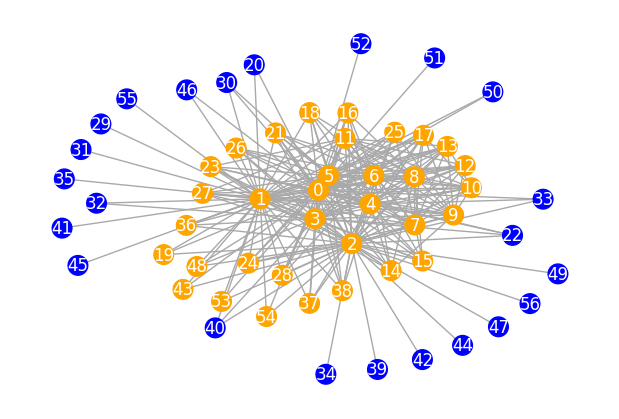

In [41]:
center = nx.center(c_g)
periphery = nx.periphery(c_g)

colors = ["orange" if n in center else "blue" if n in periphery else "gray" for n in c_g.nodes]
labels = {n: str(n) for n in c_g.nodes}

plt.figure(figsize=(6,4))
nx.draw_kamada_kawai(c_g, node_color=colors, node_size=200, edge_color="darkgray", labels=labels, font_color='white')

### **Métricas Macro**

#### **Kemeny Constant** y **Algebraic Connectivity**
- Kemeny constant: Mide el tiempo necesario para propagarse la información a través de un grafo
- Algebraic Connectivity: Indica qué tan rápido se puede difundir la información en una red

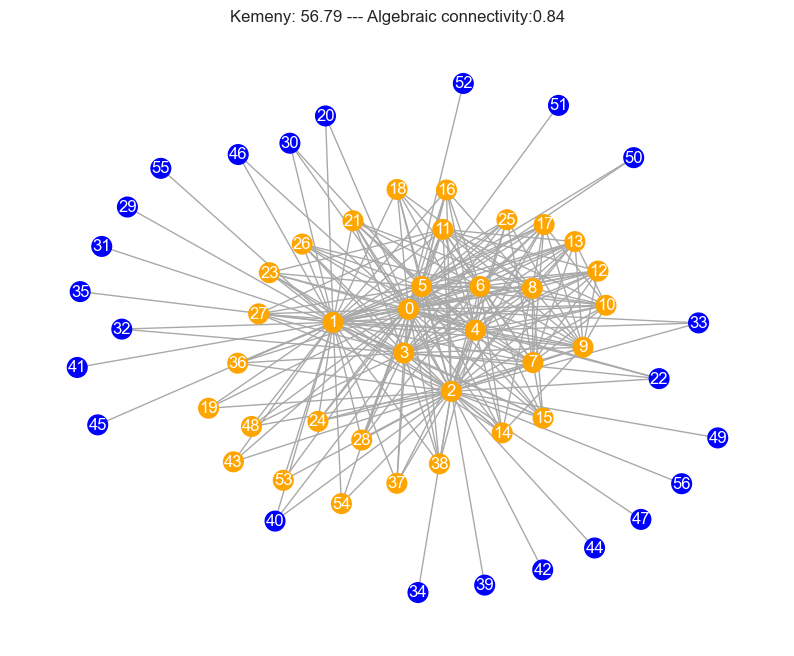

In [68]:
# Kemeny Constant
center = nx.center(c_g)
periphery = nx.periphery(c_g)

colors = ["orange" if n in center else "blue" if n in periphery else "gray" for n in c_g.nodes]

labels = {n: str(n) for n in c_g.nodes}
plt.figure(figsize=(10, 8))  
ax = plt.gca()

pos = nx.kamada_kawai_layout(c_g)  # se recuperan las posiciones de los nodos mediante el layot de kamada_kawai

ax.set_title(f"Kemeny: {nx.kemeny_constant(c_g):.2f} --- Algebraic connectivity:{nx.algebraic_connectivity(c_g):.2f}")

nx.draw(
    c_g, 
    pos, 
    node_color=colors, 
    node_size=200, 
    edge_color="darkgray", 
    labels=labels, 
    font_size=12, 
    font_color="white"
)
plt.show()

#### **Transitivity**
*La probabilidad de que dos vértices conectados a un vecino común también estén conectados entre sí se denomina transitividad.
Un grafo con alta transitividad tiende a tener vértices densamente interconectados, formando grupos o clústeres.*

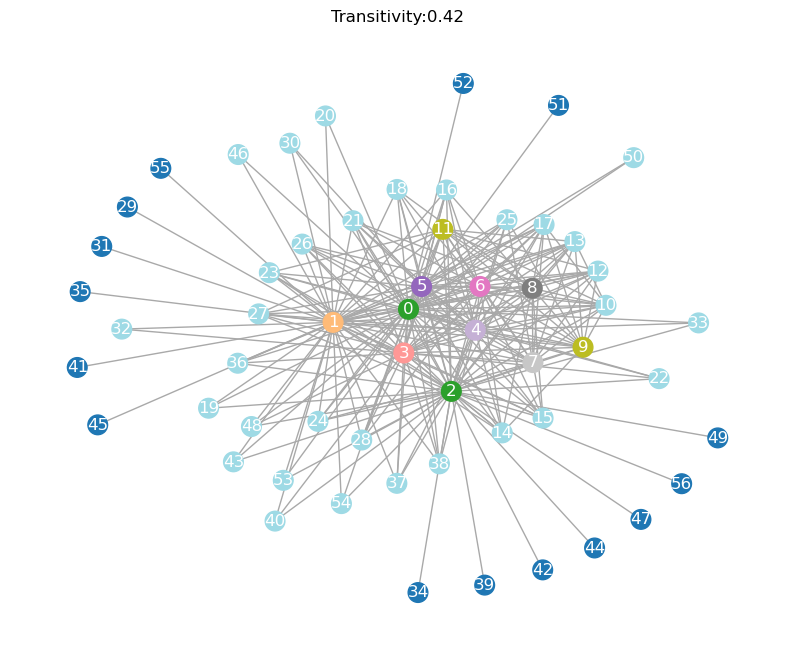

In [59]:
# Transitivity
colors = assign_colors([v for v in nx.clustering(c_g).values()])
labels = {n: str(n) for n in c_g.nodes}

plt.figure(figsize=(10, 8))  
ax = plt.gca()

pos = nx.kamada_kawai_layout(c_g)
ax.set_title(f"Transitivity:{nx.transitivity(c_g):.2f}")

nx.draw(
    c_g, 
    pos, 
    node_color=colors, 
    node_size=200, 
    edge_color="darkgray", 
    labels=labels, 
    font_size=12, 
    font_color="white"
)
plt.show()

#### **Assortativity numérica**

*La asortatividad en este contexto podría indicar cómo las comunidades se agrupan entre sí en función de un atributo como el número total de mensajes en cada comunidad, el número de hashtags de cada comunidad o similitud de hashtags (en caso de comunidades solapadas)*

1. Assortativity según el número **total de mensajes de cada comunidad**: si las comunidades más grandes tienden a conectarse entre sí, o si las comunidades más pequeñas tienen más interacciones con las grandes.


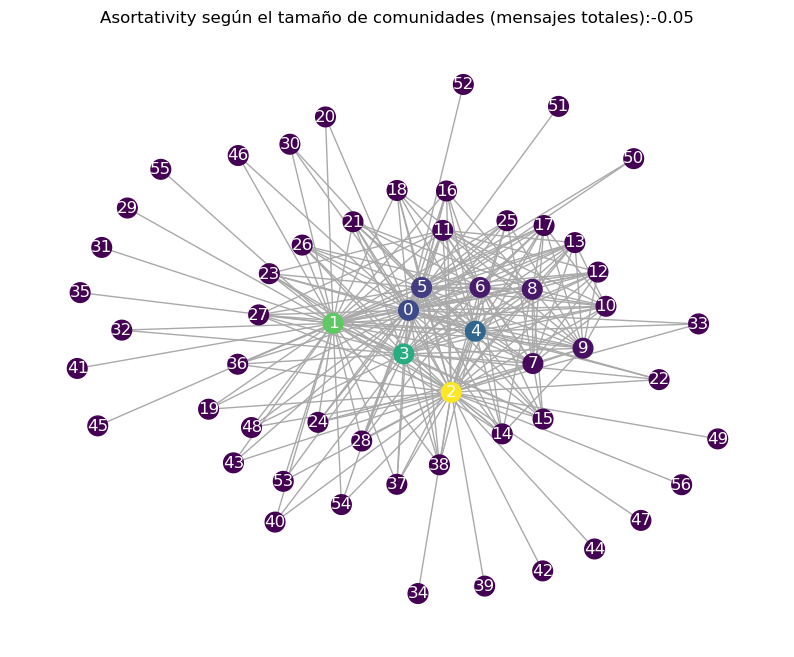

In [60]:
# 1. Assortativity segun el peso de las aristas: mensajes compartidos entre comunidades
colors = [d["weight"] for _,d in c_g.nodes(data=True)]
labels = {n: str(n) for n in c_g.nodes}

plt.figure(figsize=(10, 8))  
ax = plt.gca()

pos = nx.kamada_kawai_layout(c_g)
ax.set_title(f"Asortativity según el tamaño de comunidades (mensajes totales):{nx.attribute_assortativity_coefficient(c_g, 'weight'):.2f}")

nx.draw(
    c_g, 
    pos, 
    node_color=colors, 
    node_size=200, 
    edge_color="darkgray", 
    labels=labels, 
    font_size=12, 
    font_color="white"
)
plt.show()

#### **Grado de las comunidades y número de aristas en total**

### Densidad de aristas
Densidad de aristas de la red compromida: 0.15601503759398497

### Grado de las comunidades de la red compromida


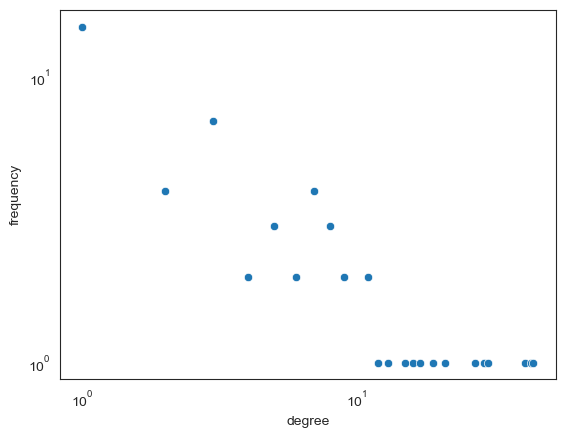

In [61]:
import seaborn as sns

###################################################
### Densidad red social ###
print("### Densidad de aristas")
###################################################

N = c_g.number_of_nodes()
M = c_g.number_of_edges()
total = (N*(N-1))/2
print(f"Densidad de aristas de la red compromida: {M/total}")
print("")


###################################################
### Grado de los nodos ###
print(f"### Grado de las comunidades de la red compromida")
###################################################

sns.set_style("white")
frequency = nx.degree_histogram(c_g)
data = pd.DataFrame({
    "degree": list(range(len(frequency))),  
    "frequency": frequency 
})

sns.scatterplot(x="degree", y="frequency", data=data)

plt.xscale('log')
plt.yscale('log')
plt.show()
print("")

El Kemeny Constant de 56.79 (relativamente alto) sugiere que la conectividad entre las comunidades dentro del grafo es algo débil, lo que implica que la propagación de información entre ellas podría ser más lenta, ya que los nodos no están tan cercanos entre sí. La conectividad algebraica de 0.84 es moderadamente alta, lo que indica que, aunque las comunidades no estén completamente interconectadas, dentro de ellas existe una estructura bastante cohesiva, lo que facilita la propagación de información dentro de cada grupo.

Por otro lado, la transitividad de 0.42 indica una cohesión moderada dentro de las comunidades, aunque no todos los nodos están completamente conectados entre sí. La asortatividad negativa de -0.05 muestra que los nodos con diferentes grados de conectividad tienden a conectarse entre sí.  Finalmente, la baja densidad de aristas de 0.156 revela que la red es relativamente dispersa, con muchas comunidades que no están completamente interconectadas, reflejando la diversidad de temas y de idiomas de los hashtags, donde los temas específicos o los hashtags en diferentes idiomas están menos conectados con otros. Además hay que tener en cuenta de que la formación de estas comunidades depende del algoritmo utilizado, en este caso se hace uso de Leiden.

## Ejercicio 5. Solapamiento de comunidades 

**Enunciado**: ¿Merece la pena hacer comunidades solapadas o no solapadas?

Sobre el grafo original de hashtags, el cálculo de comunidades **solapadas** permite identificar qué nodos (hashtags) actúan como puentes entre distintos perfiles de comunidades. Un hashtag puede pertenecer a más de una comunidad, lo que indica que representa temas comunes a ambas. Esta información es valiosa porque ayuda a entender las conexiones conceptuales o temáticas entre las comunidades, indicando los hashtags que funcionan como intermediarios en la red.

Si el objetivo es analizar las interacciones generales entre grupos diferenciados, las comunidades **no solapadas** pueden ser más adecuadas, ya que ofrecen una representación simplificada. En el caso de la red comprimida por comunidades sin solapamiento, las aristas dentro de las comunidades deben interpretarse como fuertes, ya que indican interacciones relevantes entre los nodos de la misma comunidad. Por otro lado, las aristas entre comunidades deberían ser más débiles, porque si la conexión fuese fuerte, implicaría que los nodos de ambas comunidades deberían estar en una sola comunidad, en contradicción de la estructura de la red comprimida.


## Ejercicio 6. 
**Enunciado**: ¿Si visualizamos la/s comunidad/es más grandes y las más pequeñas que se ve, que
nos dice esa representación?

*definicion de tamaño de comunidad en base a hashtags o a numero de mensajes*

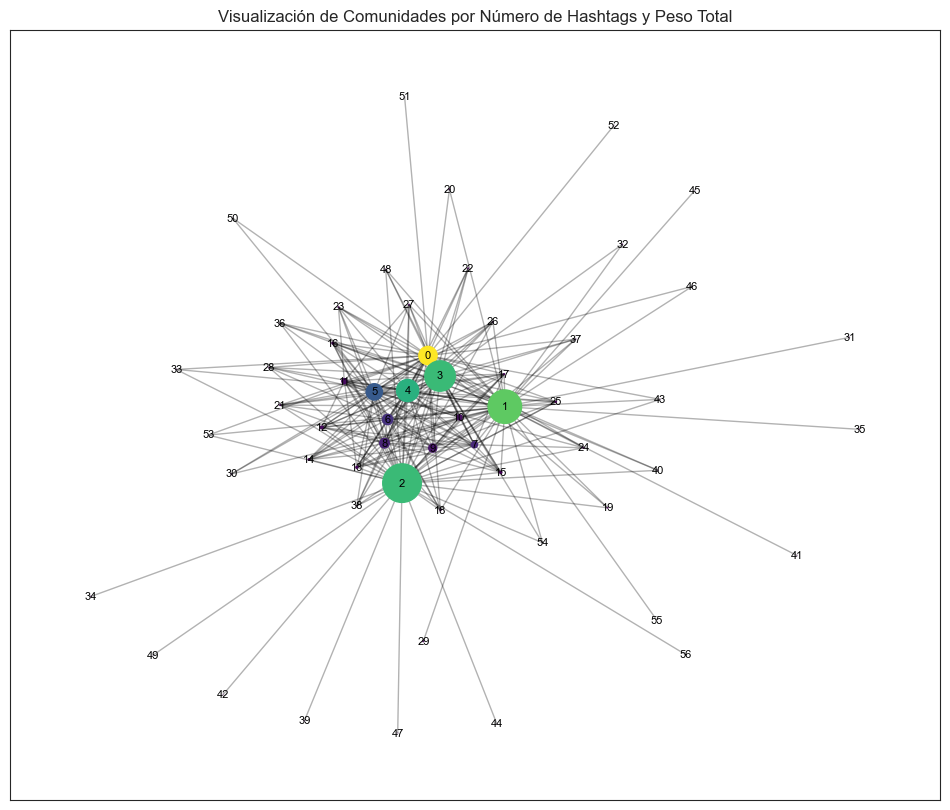

In [132]:
import matplotlib.pyplot as plt

c_g = nx.read_graphml("collapsed_graph_withHashtags_completed.graphml")

# tamaño de las comunidades según el número de hashtags y el peso
community_sizes = {}
community_weights = {}

for node, data in c_g.nodes(data=True):
    num_hashtags = len(eval(data['hashtags']))  # Número de hashtags en la comunidad
    weight = data['weight']  # Peso total de la comunidad

    community_sizes[node] = num_hashtags
    community_weights[node] = weight

top_10_large_nodes = sorted(community_weights.items(), key=lambda x: x[1], reverse=True)[:10]
top_10_large_nodes = [node for node, _ in top_10_large_nodes]

# tamaño de los nodos, normalizado
node_sizes = [community_weights[node] / 10000 for node in c_g.nodes()] 

color_map = [community_sizes[node] for node in c_g.nodes()]  # Usamos el número de hashtags como color

pos = nx.spring_layout(c_g, seed=42)

plt.figure(figsize=(12, 10))
nx.draw_networkx_nodes(c_g, pos, node_size=node_sizes, cmap=plt.cm.get_cmap('viridis', max(community_sizes.values())), node_color=color_map)
nx.draw_networkx_edges(c_g, pos, alpha=0.3)
nx.draw_networkx_labels(c_g, pos, font_size=8, font_color='black')

plt.title("Visualización de Comunidades por Número de Hashtags y Peso Total")
plt.show()

Los nodos con colores más claros y tamaños más grandes representan comunidades con más actividad e influencia; por otra parte los colores más oscuros y tanaños más pequeños reflejan los que tienen menos conexión y número de hashtags.
Dentro de los 10 nodos más representativos de la red y observando la red:
- Los nodos 1 (verde claro) y 2 (verde oscuro), con colores brillantes y tamaños grandes, representan comunidades prominentes con una gran cantidad de hashtags y un peso significativo en la red (son las comunidades más influyentes o relevantes)
- Los nodos 3 (verde oscuro) y 4 (verde oscuro) tienen un número moderado de hashtags y un tamaño más pequeño, lo que sugiere que son comunidades relevantes pero no tan influyentes como las anteriores
- Los nodos 5 (morado) y 6, 8, 9, 10 (morado oscuro) son las comunidades menos activas, con un número bajo de hashtags y tamaños pequeños, indicando que tienen una influencia limitada en la red.

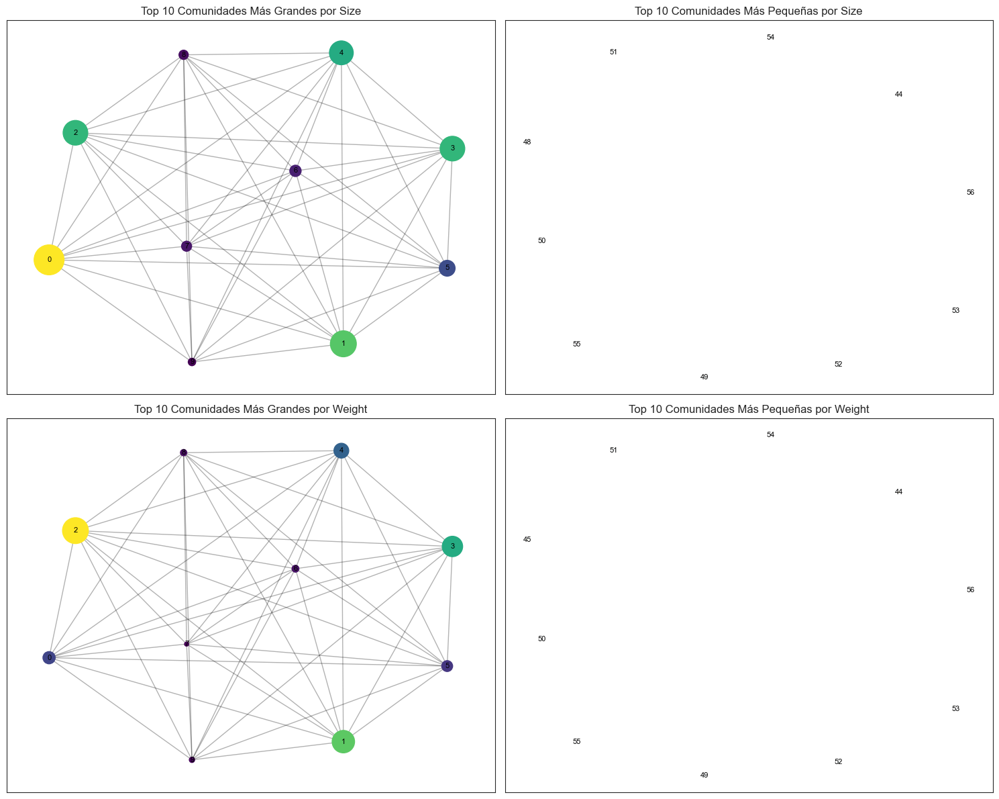

In [139]:
import matplotlib.pyplot as plt
import networkx as nx

c_g = nx.read_graphml("collapsed_graph_withHashtags_completed.graphml")

# tamaño de las comunidades según el número de hashtags y el peso
community_sizes = {}
community_weights = {}

for node, data in c_g.nodes(data=True):
    num_hashtags = len(eval(data['hashtags']))  # Número de hashtags en la comunidad
    weight = data['weight']  # Peso total de la comunidad

    community_sizes[node] = num_hashtags
    community_weights[node] = weight

# 10 comunidades más grandes y más pequeñas por 'size'
top_10_large_nodes_size = sorted(community_sizes.items(), key=lambda x: x[1], reverse=True)[:10]
top_10_small_nodes_size = sorted(community_sizes.items(), key=lambda x: x[1])[:10]

# 10 comunidades más grandes y más pequeñas por 'weight'
top_10_large_nodes_weight = sorted(community_weights.items(), key=lambda x: x[1], reverse=True)[:10]
top_10_small_nodes_weight = sorted(community_weights.items(), key=lambda x: x[1])[:10]

fig, axs = plt.subplots(2, 2, figsize=(15, 12))

# 10 comunidades más grandes por 'size'
top_10_large_nodes_size = [node for node, _ in top_10_large_nodes_size]
subgraph_large_size = c_g.subgraph(top_10_large_nodes_size)
node_sizes = [community_sizes[node] / 10 for node in subgraph_large_size.nodes()]  # Normalización de tamaños
color_map = [community_sizes[node] for node in subgraph_large_size.nodes()]  

pos = nx.spring_layout(subgraph_large_size, seed=42)
axs[0, 0].set_title("Top 10 Comunidades Más Grandes por Size")
nx.draw_networkx_nodes(subgraph_large_size, pos, node_size=node_sizes, cmap=plt.cm.viridis, node_color=color_map, ax=axs[0, 0])
nx.draw_networkx_edges(subgraph_large_size, pos, alpha=0.3, ax=axs[0, 0])
nx.draw_networkx_labels(subgraph_large_size, pos, font_size=8, font_color='black', ax=axs[0, 0])

# 10 comunidades más pequeñas por 'size'
top_10_small_nodes_size = [node for node, _ in top_10_small_nodes_size]
subgraph_small_size = c_g.subgraph(top_10_small_nodes_size)
node_sizes = [community_sizes[node] / 1000 for node in subgraph_small_size.nodes()]  # Normalización de tamaños
color_map = [community_sizes[node] for node in subgraph_small_size.nodes()] 

pos = nx.spring_layout(subgraph_small_size, seed=42)
axs[0, 1].set_title("Top 10 Comunidades Más Pequeñas por Size")
nx.draw_networkx_nodes(subgraph_small_size, pos, node_size=node_sizes, cmap=plt.cm.viridis, node_color=color_map, ax=axs[0, 1])
nx.draw_networkx_edges(subgraph_small_size, pos, alpha=0.3, ax=axs[0, 1])
nx.draw_networkx_labels(subgraph_small_size, pos, font_size=8, font_color='black', ax=axs[0, 1])

# 10 comunidades más grandes por 'weight'
top_10_large_nodes_weight = [node for node, _ in top_10_large_nodes_weight]
subgraph_large_weight = c_g.subgraph(top_10_large_nodes_weight)
node_sizes = [community_weights[node] / 10000 for node in subgraph_large_weight.nodes()]  # Normalización de tamaños
color_map = [community_weights[node] for node in subgraph_large_weight.nodes()]  

pos = nx.spring_layout(subgraph_large_weight, seed=42)
axs[1, 0].set_title("Top 10 Comunidades Más Grandes por Weight")
nx.draw_networkx_nodes(subgraph_large_weight, pos, node_size=node_sizes, cmap=plt.cm.viridis, node_color=color_map, ax=axs[1, 0])
nx.draw_networkx_edges(subgraph_large_weight, pos, alpha=0.3, ax=axs[1, 0])
nx.draw_networkx_labels(subgraph_large_weight, pos, font_size=8, font_color='black', ax=axs[1, 0])

# 10 comunidades más pequeñas por 'weight'
top_10_small_nodes_weight = [node for node, _ in top_10_small_nodes_weight]
subgraph_small_weight = c_g.subgraph(top_10_small_nodes_weight)
node_sizes = [community_weights[node] / 10000 for node in subgraph_small_weight.nodes()]  # Normalización de tamaños
color_map = [community_weights[node] for node in subgraph_small_weight.nodes()]  

pos = nx.spring_layout(subgraph_small_weight, seed=42)
axs[1, 1].set_title("Top 10 Comunidades Más Pequeñas por Weight")
nx.draw_networkx_nodes(subgraph_small_weight, pos, node_size=node_sizes, cmap=plt.cm.viridis, node_color=color_map, ax=axs[1, 1])
nx.draw_networkx_edges(subgraph_small_weight, pos, alpha=0.3, ax=axs[1, 1])
nx.draw_networkx_labels(subgraph_small_weight, pos, font_size=8, font_color='black', ax=axs[1, 1])

plt.tight_layout()
plt.show()

## Ejercicio 7.
**Enunciado**:  Finalmente, describe los contenidos de cada comunidad. ¿Es posible, aunque sea intuitivamente, caracterizar una comunidad en función de sus hashtags más importantes?

In [48]:
from cdlib.algorithms import leiden

G_aux = G.copy()
community_map = leiden(G_aux).to_node_community_map() # Algoritmo de Leiden. community_map es un diccionario {0: [0], 1: [0], 2: [1]...}, siendo [0] la comunidad a la que pertenece un nodo
community_map = {node: community[0] for node, community in community_map.items()} # Obtenemos las comunidades de cada nodo para almacenar el dict = {0: 0, 1: 0, 2: 1...},

unique_communities = set(community_map.values())

print(f"Número de comunidades (ALG. Leiden): {len(unique_communities)}")

Número de comunidades (ALG. Leiden): 39


In [49]:
from collections import defaultdict

# Comunidad y los hashtags correspondientes
community_hashtags = defaultdict(list)

for node, community in community_map.items():
    community_hashtags[community].append(node)  

df_community_hashtags = pd.DataFrame([(community, hashtags) for community, hashtags in community_hashtags.items()],
                                     columns=["Comunidad", "Hashtags"])

df_community_hashtags



,Comunidad,Hashtags
0,0,"[nzpol, TTIP, Pakistan, Noticias, recall, USDe..."
1,1,"[ocra, TeePublic, thankyou, ellenhenryart, dig..."
2,2,"[Hoax, MondayMorning, RememberinNovember, Unit..."
3,3,"[Υστερογραφα, wildlifephototgraphy, birds, bir..."
4,4,"[SmellDog, Stimulus, James, WaterIsland, tgdn,..."
5,5,"[FringeLeftists, Epsteindidntkillhimself, AGBA..."
6,6,"[lockdown, COVID19Vic, LawAndOrderNow, Emmys, ..."
7,7,"[Chine, OMS, Beijing, Muslim, International, B..."
8,8,"[ALLLIVESMATTER, Jinek, nosjournaal, FRAUD, PO..."
9,9,"[EURUSD, NASDAQ, forex, forex_fx, orbex_fx, an..."


Se ha recogido los hashtags que pertenecen a cada comunidad, a continuación se hace uso de las nubes de palabras para facilitar la visualización y búsqueda de tópicos o temas que caractericen a cada comunidad.

## Visualización de los hashtags de las comunidades

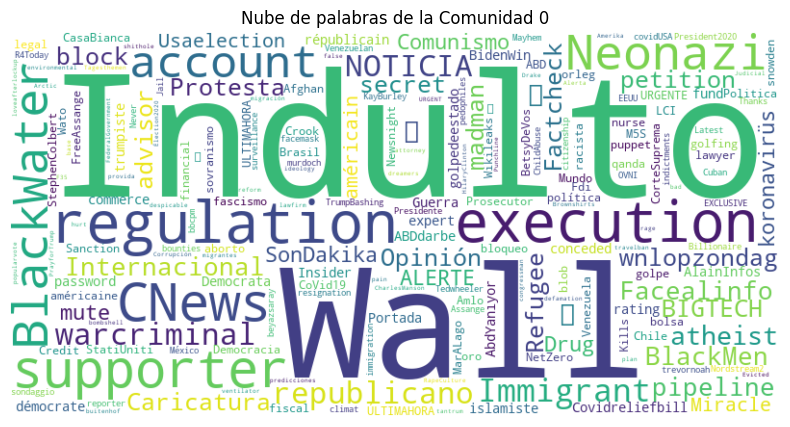

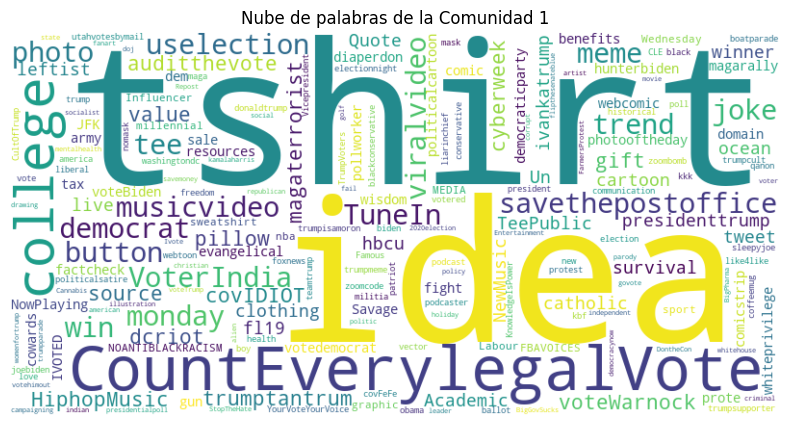

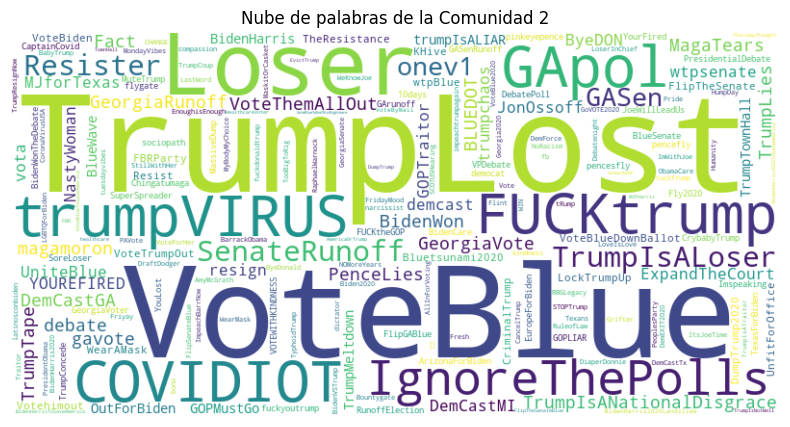

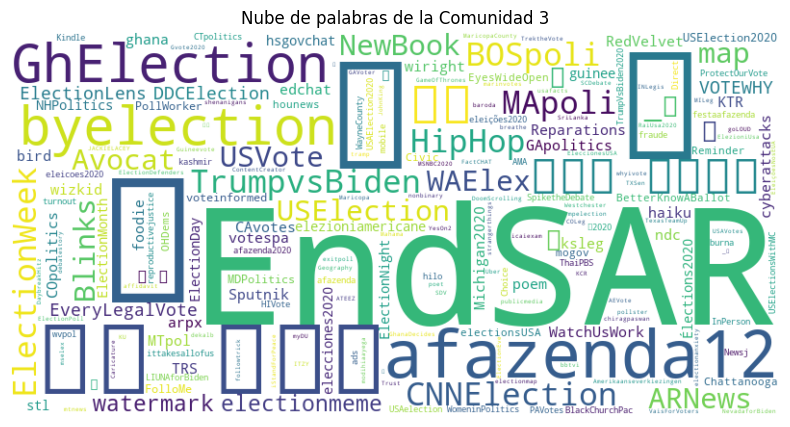

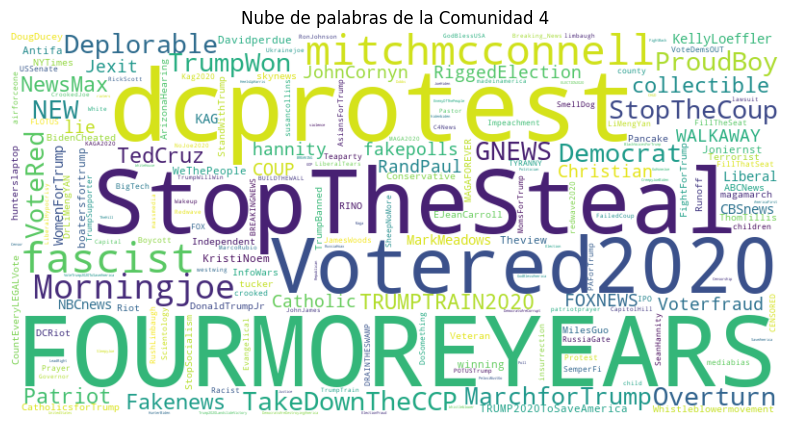

...

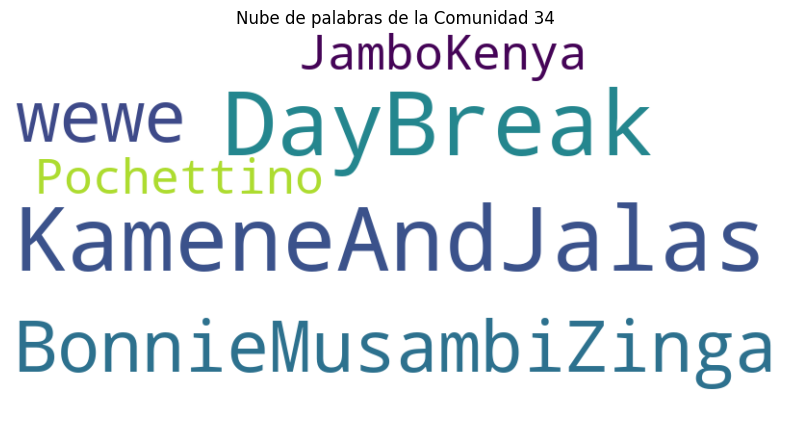

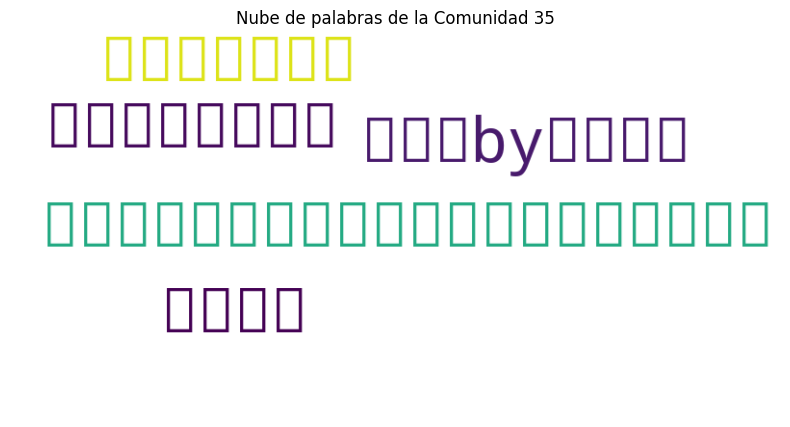

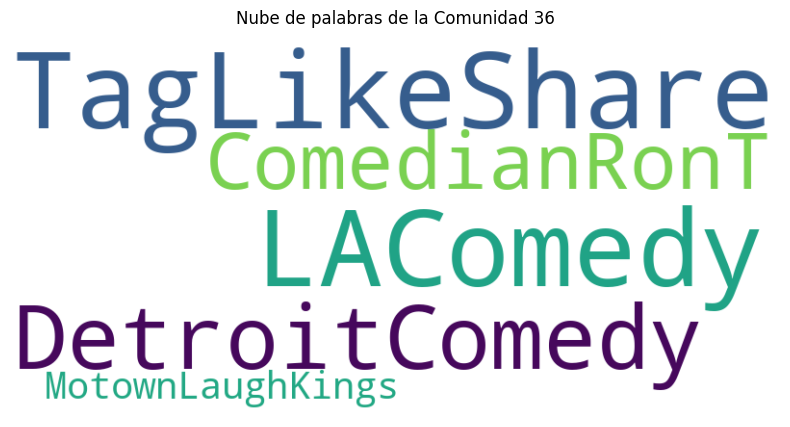

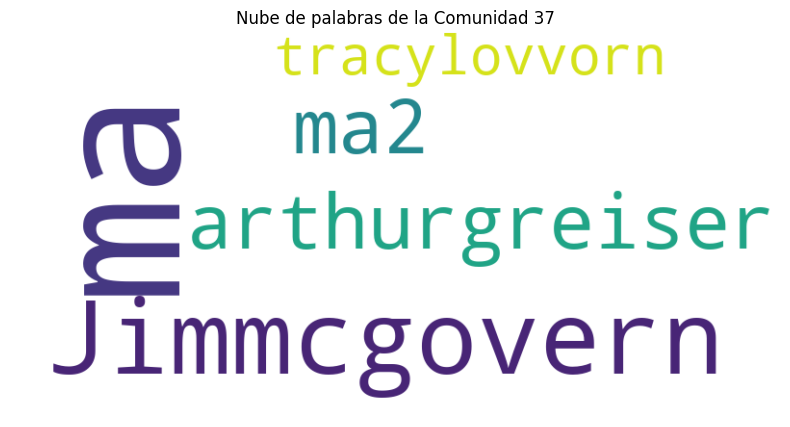

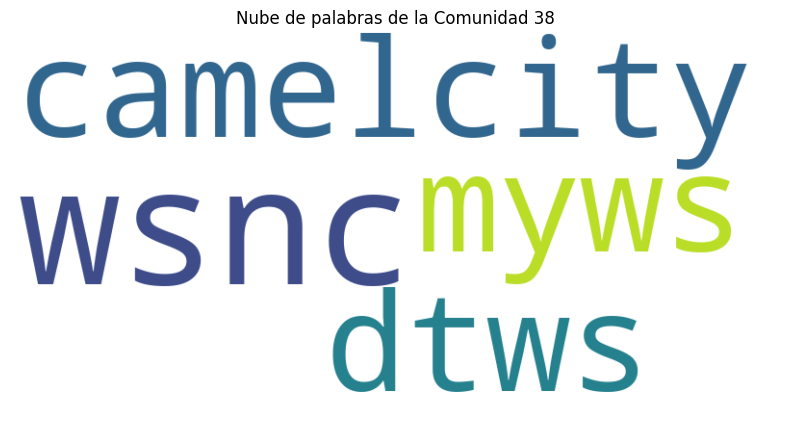

In [51]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict

#Visualizar
community_hashtags = defaultdict(list)

for node, community in community_map.items():
    community_hashtags[community].append(node)  

# Crear una nube de palabras para cada comunidad
for community, hashtags in community_hashtags.items():
    # Crear un texto único con todos los hashtags para esta comunidad
    text = ' '.join(hashtags)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")  
    plt.title(f"Nube de palabras de la Comunidad {community}")
    plt.show()

Es posible, aunque de manera intuitiva, caracterizar una comunidad en función de los hashtags más representativos de la misma al intentar intuir diferentes tópicos o temas. Sin embargo, este proceso resulta complicado debido a la complejidad de las relaciones entre las comunidades. En el caso de esta red, las aristas entre los nodos indican que los hashtags han aparecido conjuntamente en los mismos tweets, y el peso de las aristas refleja la frecuencia con la que estos hashtags se mencionan de forma conjunta. Sin embargo, al agrupar los hashtags en comunidades, se presentan diversas dificultades: 
- Una de las principales limitaciones es que, aunque los hashtags estén relacionados dentro de la red, pueden no tener una conexión contextual clara; un hashtag podría aparecer en debates o discusiones sobre temas completamente diferentes, debido a las distintas interpretaciones políticas y sociales, lo que dificulta la identificación de relaciones evidentes entre ellos.
- En el contexto político, los hashtags pueden adquirir significados distintos dependiendo de los contextos de las intenciones con que se utilicen, lo cual agrega un nivel de complejidad al tratar de caracterizar una comunidad solo a partir de los hashtags.
- Otro factor a tener en cuenta es el idioma, ya que algunos hashtags pueden encontrarse aislados en comunidades que operan en diferentes lenguajes, lo que dificulta aún más la interpretación y búsqueda de las temáticas comunes dentro de cada comunidad.







Algunos de los posibles hashtags que pueden caracterizar las comunidades son aquellos cuyas palabras o términos se repiten mas:
- Hay comunidades donde hay una mayor presencia del nombre 'Trump' seguido de insultos lo que se puede caracterizar con textos en contra del político 
- Otras comunidades tienen una mayor presencia de nombres de países y continentes, lo que puede reflejar temáticas políticas de impacto mundial
- Otras tienen un mayor contexto tecnológico al incluir palabras relacionadas con la programación y la tecnología como son 'Python', 'JavaScript', 'dataScientist'
Sin embargo sigue habiendo presencia de hashtags que poca relacion tienen que ver entre sí o la presencia de aquellos en idiomas diferentes que hacen que se tenga comunidades aisladas con muy pocos hashtags